# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

In [100]:
# Libraries for data loading, data manipulation and data visulisation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')
# Libraries for data preparation and model building
#import *
%matplotlib notebook
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D

from statsmodels.graphics.correlation import plot_corr
from statsmodels.formula.api import ols
from scipy.stats import pearsonr
import statsmodels.formula.api as sm
from sklearn.linear_model import LinearRegression
from sklearn import metrics

import csv


# Setting global constants to ensure notebook results are reproducible
#PARAMETER_CONSTANT = ###

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

In [5]:
df_train = pd.read_csv('/Users/admin/Documents/Data Science/Explore/R/Advanced-Regression-Starter-Data/df_train.csv') 
df_test = pd.read_csv('/Users/admin/Documents/Data Science/Explore/R/Advanced-Regression-Starter-Data/df_test.csv')

In [10]:
df_train.head(2)

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.0,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.0,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667


In [11]:
df_test.head(2)

,Unnamed: 0,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,...,Barcelona_temp_max,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min
0,8763,2018-01-01 00:00:00,5.000000,level_8,0.0,5.000000,87.0,71.333333,20.0,3.000000,...,287.816667,280.816667,287.356667,276.150000,280.38,286.816667,285.15,283.15,279.866667,279.15
1,8764,2018-01-01 03:00:00,4.666667,level_8,0.0,5.333333,89.0,78.000000,0.0,3.666667,...,284.816667,280.483333,284.190000,277.816667,281.01,283.483333,284.15,281.15,279.193333,278.15


<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


In [ ]:
# look at data statistics

In [7]:
df_train.shape

(8763, 49)

In [9]:
df_test.shape

(2920, 48)

In [13]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 49 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Unnamed: 0            8763 non-null   int64  
 1   time                  8763 non-null   object 
 2   Madrid_wind_speed     8763 non-null   float64
 3   Valencia_wind_deg     8763 non-null   object 
 4   Bilbao_rain_1h        8763 non-null   float64
 5   Valencia_wind_speed   8763 non-null   float64
 6   Seville_humidity      8763 non-null   float64
 7   Madrid_humidity       8763 non-null   float64
 8   Bilbao_clouds_all     8763 non-null   float64
 9   Bilbao_wind_speed     8763 non-null   float64
 10  Seville_clouds_all    8763 non-null   float64
 11  Bilbao_wind_deg       8763 non-null   float64
 12  Barcelona_wind_speed  8763 non-null   float64
 13  Barcelona_wind_deg    8763 non-null   float64
 14  Madrid_clouds_all     8763 non-null   float64
 15  Seville_wind_speed   

The train data has three category data type and 45 numerical data type. Valencia_pressure has some null values.

In [14]:
#to check the numbers of null values
df_train.isnull().sum() 

Unnamed: 0                 0
time                       0
Madrid_wind_speed          0
Valencia_wind_deg          0
Bilbao_rain_1h             0
Valencia_wind_speed        0
Seville_humidity           0
Madrid_humidity            0
Bilbao_clouds_all          0
Bilbao_wind_speed          0
Seville_clouds_all         0
Bilbao_wind_deg            0
Barcelona_wind_speed       0
Barcelona_wind_deg         0
Madrid_clouds_all          0
Seville_wind_speed         0
Barcelona_rain_1h          0
Seville_pressure           0
Seville_rain_1h            0
Bilbao_snow_3h             0
Barcelona_pressure         0
Seville_rain_3h            0
Madrid_rain_1h             0
Barcelona_rain_3h          0
Valencia_snow_3h           0
Madrid_weather_id          0
Barcelona_weather_id       0
Bilbao_pressure            0
Seville_weather_id         0
Valencia_pressure       2068
Seville_temp_max           0
Madrid_pressure            0
Valencia_temp_max          0
Valencia_temp              0
Bilbao_weather

Valencia_pressure has 2068 null values.

In [15]:
#summary statistics of the train data
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
Unnamed: 0,8763.0,4381.000000,2529.804538,0.000000,2190.500000,4381.000000,6571.500000,8.762000e+03
Madrid_wind_speed,8763.0,2.425729,1.850371,0.000000,1.000000,2.000000,3.333333,1.300000e+01
Bilbao_rain_1h,8763.0,0.135753,0.374901,0.000000,0.000000,0.000000,0.100000,3.000000e+00
Valencia_wind_speed,8763.0,2.586272,2.411190,0.000000,1.000000,1.666667,3.666667,5.200000e+01
Seville_humidity,8763.0,62.658793,22.621226,8.333333,44.333333,65.666667,82.000000,1.000000e+02
Madrid_humidity,8763.0,57.414717,24.335396,6.333333,36.333333,58.000000,78.666667,1.000000e+02
Bilbao_clouds_all,8763.0,43.469132,32.551044,0.000000,10.000000,45.000000,75.000000,1.000000e+02
Bilbao_wind_speed,8763.0,1.850356,1.695888,0.000000,0.666667,1.000000,2.666667,1.266667e+01
Seville_clouds_all,8763.0,13.714748,24.272482,0.000000,0.000000,0.000000,20.000000,9.733333e+01
Bilbao_wind_deg,8763.0,158.957511,102.056299,0.000000,73.333333,147.000000,234.000000,3.593333e+02


In [16]:
#Data distribution
df_train.skew()

Unnamed: 0               0.000000
Madrid_wind_speed        1.441144
Bilbao_rain_1h           5.222802
Valencia_wind_speed      3.499637
Seville_humidity        -0.310175
Madrid_humidity         -0.057378
Bilbao_clouds_all       -0.053085
Bilbao_wind_speed        1.716914
Seville_clouds_all       1.814452
Bilbao_wind_deg          0.226927
Barcelona_wind_speed     1.057331
Barcelona_wind_deg      -0.180001
Madrid_clouds_all        1.246745
Seville_wind_speed       1.151006
Barcelona_rain_1h        8.726988
Seville_rain_1h          8.067341
Bilbao_snow_3h          26.177568
Barcelona_pressure      57.979664
Seville_rain_3h         19.342574
Madrid_rain_1h           7.074308
Barcelona_rain_3h       12.696605
Valencia_snow_3h        63.298084
Madrid_weather_id       -3.107722
Barcelona_weather_id    -2.584011
Bilbao_pressure         -0.999642
Seville_weather_id      -3.275574
Valencia_pressure       -1.705162
Seville_temp_max        -0.033931
Madrid_pressure         -1.850768
Valencia_temp_

In [18]:
# determine present of outliers
df_train.kurtosis()

Unnamed: 0                -1.200000
Madrid_wind_speed          2.036462
Bilbao_rain_1h            32.904656
Valencia_wind_speed       35.645426
Seville_humidity          -1.017983
Madrid_humidity           -1.167537
Bilbao_clouds_all         -1.533417
Bilbao_wind_speed          3.631565
Seville_clouds_all         2.155921
Bilbao_wind_deg           -1.083530
Barcelona_wind_speed       1.493635
Barcelona_wind_deg        -0.959160
Madrid_clouds_all          0.142079
Seville_wind_speed         1.398580
Barcelona_rain_1h        101.578931
Seville_rain_1h           93.840746
Bilbao_snow_3h           806.128471
Barcelona_pressure      3687.564230
Seville_rain_3h          413.136592
Madrid_rain_1h            76.584491
Barcelona_rain_3h        187.800460
Valencia_snow_3h        4089.323165
Madrid_weather_id          9.259047
Barcelona_weather_id       5.701882
Bilbao_pressure            1.825323
Seville_weather_id        10.710308
Valencia_pressure          2.211823
Seville_temp_max          -0

The data has some outliers. Columns with kurtosis > 3 are outliers.

In [ ]:
# plot relevant feature interactions

In [20]:
features = []
for i in df_train.columns:
    features.append(df_train[i].name)

<IPython.core.display.Javascript object>


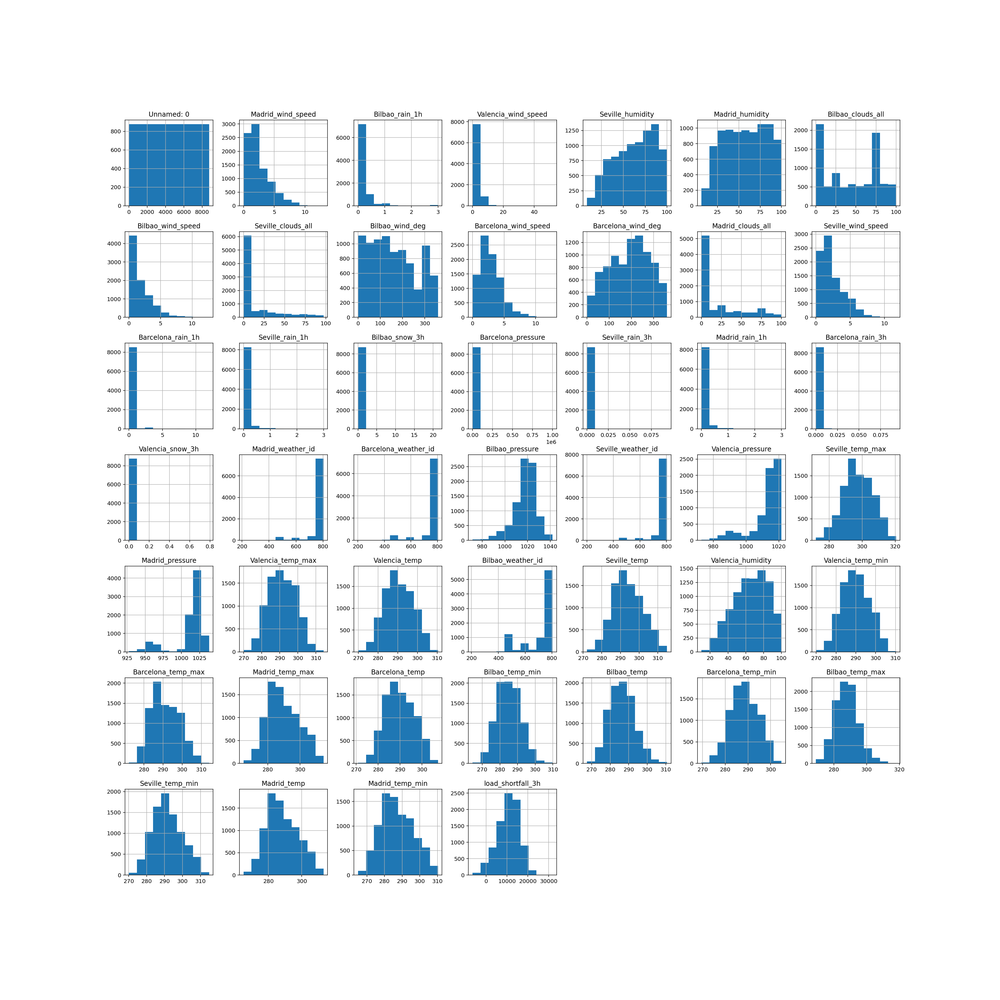

array([[<AxesSubplot:title={'center':'Unnamed: 0'}>,
        <AxesSubplot:title={'center':'Madrid_wind_speed'}>,
        <AxesSubplot:title={'center':'Bilbao_rain_1h'}>,
        <AxesSubplot:title={'center':'Valencia_wind_speed'}>,
        <AxesSubplot:title={'center':'Seville_humidity'}>,
        <AxesSubplot:title={'center':'Madrid_humidity'}>,
        <AxesSubplot:title={'center':'Bilbao_clouds_all'}>],
       [<AxesSubplot:title={'center':'Bilbao_wind_speed'}>,
        <AxesSubplot:title={'center':'Seville_clouds_all'}>,
        <AxesSubplot:title={'center':'Bilbao_wind_deg'}>,
        <AxesSubplot:title={'center':'Barcelona_wind_speed'}>,
        <AxesSubplot:title={'center':'Barcelona_wind_deg'}>,
        <AxesSubplot:title={'center':'Madrid_clouds_all'}>,
        <AxesSubplot:title={'center':'Seville_wind_speed'}>],
       [<AxesSubplot:title={'center':'Barcelona_rain_1h'}>,
        <AxesSubplot:title={'center':'Seville_rain_1h'}>,
        <AxesSubplot:title={'center':'Bilbao_sn

In [23]:
df_train[features].hist(figsize=(25,25))

<IPython.core.display.Javascript object>


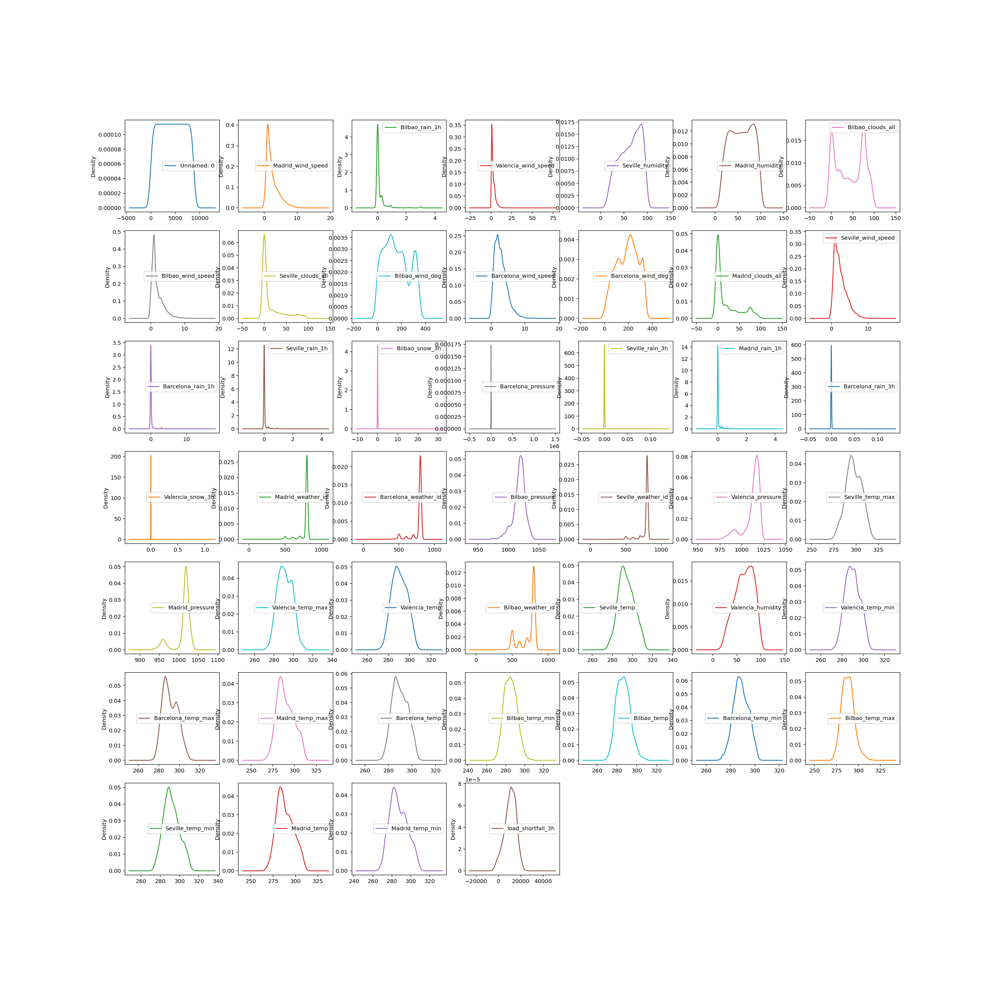

In [25]:
df_train[features].plot(kind='density', subplots=True, layout=(7, 7), sharex=False, figsize=(25, 25));

In [ ]:
# evaluate correlation

In [27]:
df_train.corr()

,Unnamed: 0,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Bilbao_wind_deg,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
Unnamed: 0,1.000000,-0.109288,-0.249633,-0.090161,-0.079025,-0.103359,-0.068123,0.049197,-0.140583,-0.155738,...,0.093378,0.068078,0.028698,0.081799,0.103436,0.146216,0.037487,0.088439,0.085197,0.192612
Madrid_wind_speed,-0.109288,1.000000,0.259719,0.513092,-0.117892,-0.137092,0.244001,0.377854,0.191251,0.270950,...,0.091464,0.080133,0.077330,0.060467,0.089992,0.042114,0.110278,0.109572,0.098138,-0.150981
Bilbao_rain_1h,-0.249633,0.259719,1.000000,0.265864,0.069878,0.106765,0.370733,0.085398,0.081131,0.279350,...,-0.148397,-0.138901,-0.141269,-0.182494,-0.106593,-0.219871,-0.120575,-0.135927,-0.116431,-0.152510
Valencia_wind_speed,-0.090161,0.513092,0.265864,1.000000,-0.075227,-0.019388,0.210524,0.386478,0.163675,0.248643,...,-0.021970,-0.021456,-0.010166,-0.022676,0.001413,-0.033271,0.003618,-0.011982,-0.019742,-0.142791
Seville_humidity,-0.079025,-0.117892,0.069878,-0.075227,1.000000,0.799831,0.061680,-0.088180,0.399436,-0.087246,...,-0.708937,-0.617797,-0.605493,-0.604733,-0.595065,-0.583718,-0.784850,-0.717171,-0.688664,-0.167290
Madrid_humidity,-0.103359,-0.137092,0.106765,-0.019388,0.799831,1.000000,0.041878,-0.016808,0.374112,-0.069570,...,-0.803260,-0.684867,-0.635760,-0.634825,-0.636777,-0.611395,-0.769591,-0.802605,-0.759633,-0.150536
Bilbao_clouds_all,-0.068123,0.244001,0.370733,0.210524,0.061680,0.041878,1.000000,0.031915,0.046737,0.280154,...,-0.048491,-0.023171,-0.067731,-0.114118,-0.010804,-0.158014,-0.077417,-0.046686,-0.046189,-0.127293
Bilbao_wind_speed,0.049197,0.377854,0.085398,0.386478,-0.088180,-0.016808,0.031915,1.000000,0.127344,0.417534,...,0.025367,0.018967,0.107302,0.142435,0.023711,0.177123,0.055077,0.031245,0.021425,-0.081602
Seville_clouds_all,-0.140583,0.191251,0.081131,0.163675,0.399436,0.374112,0.046737,0.127344,1.000000,0.053482,...,-0.238895,-0.186463,-0.134249,-0.152393,-0.153412,-0.165567,-0.200453,-0.227094,-0.212758,-0.091804
Bilbao_wind_deg,-0.155738,0.270950,0.279350,0.248643,-0.087246,-0.069570,0.280154,0.417534,0.053482,1.000000,...,0.028535,0.068701,0.095047,0.065396,0.086482,0.031187,0.062663,0.044102,0.048397,-0.120800


<IPython.core.display.Javascript object>


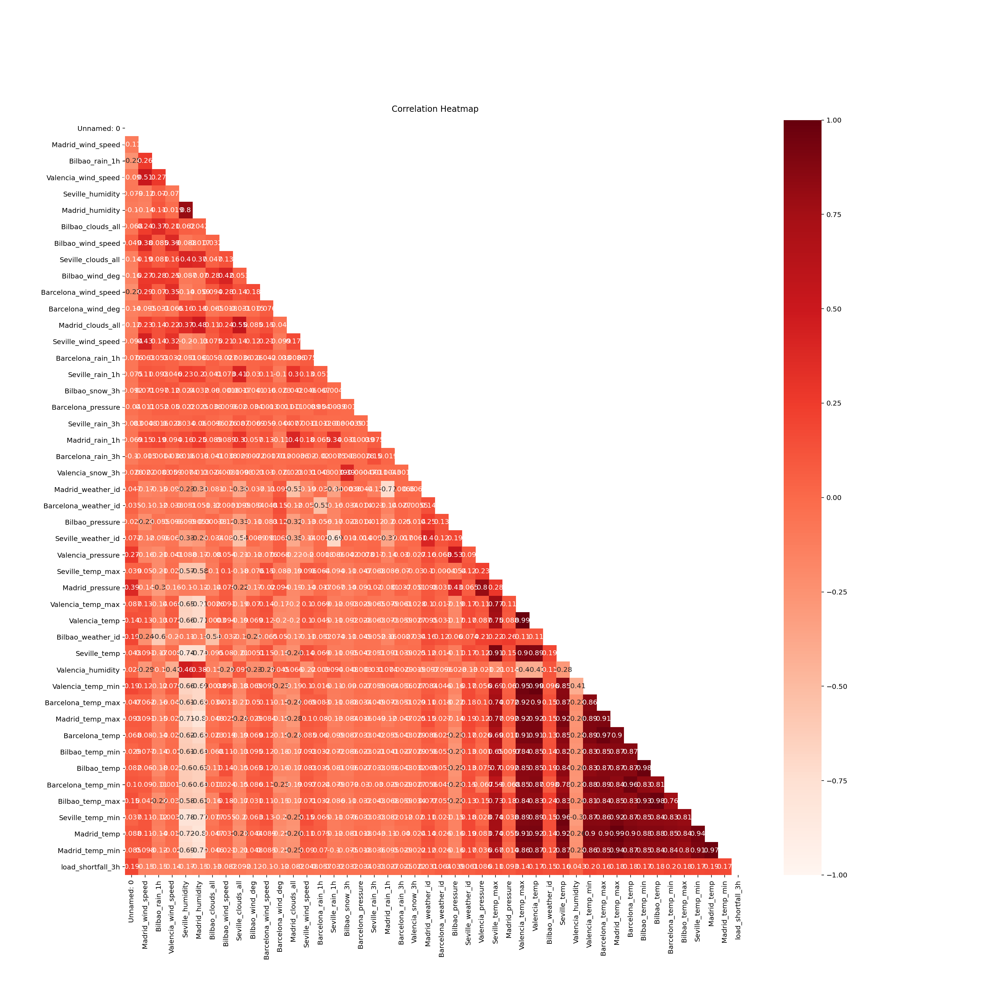

Text(0.5, 1.0, 'Correlation Heatmap')

In [29]:
plt.figure(figsize=(20, 20))
mask = np.triu(np.ones_like(df_train.corr(), dtype=np.bool))
heatmap = sns.heatmap(df_train.corr(), vmin=-1, mask = mask,vmax=1, annot=True,cmap = 'Reds')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':12}, pad=12)

In [ ]:
# have a look at feature distributions

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

In [ ]:
TRAIN DATA

In [ ]:
# remove missing values/ features

In [30]:
df_train.drop('Unnamed: 0', axis=1, inplace=True)
df_train

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Madrid_temp_max,Barcelona_temp,Bilbao_temp_min,Bilbao_temp,Barcelona_temp_min,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,load_shortfall_3h
0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.000000,1.000000,0.000000,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.000000,1.000000,0.000000,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.000000,1.000000,0.000000,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.000000,1.000000,0.000000,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.000000,0.333333,0.000000,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8758,2017-12-31 09:00:00,1.000000,level_6,0.0,2.666667,89.000000,95.666667,56.666667,4.333333,80.000000,...,280.816667,281.276667,285.150000,287.573333,280.483333,290.150000,284.816667,279.686667,278.483333,-28.333333
8759,2017-12-31 12:00:00,5.000000,level_6,0.0,2.000000,82.000000,85.000000,26.666667,8.000000,75.000000,...,283.483333,287.483333,286.483333,288.616667,287.150000,291.150000,287.150000,282.400000,280.150000,2266.666667
8760,2017-12-31 15:00:00,6.333333,level_9,0.4,7.333333,67.666667,71.000000,63.333333,8.333333,33.333333,...,285.150000,289.816667,283.816667,285.330000,289.150000,286.816667,289.150000,283.956667,281.150000,822.000000
8761,2017-12-31 18:00:00,7.333333,level_8,0.2,7.333333,67.666667,79.000000,63.333333,2.666667,51.666667,...,283.483333,287.523333,278.816667,281.410000,286.816667,284.150000,289.150000,282.666667,280.816667,-760.000000


In [31]:
df_train['Valencia_pressure'].fillna(value = df_train['Valencia_pressure'].median(),inplace= True)
df_train.isnull().any().sum()

0

In [ ]:
# create new features

In [32]:
df= df_train.copy()

In [ ]:
# engineer existing features

In [33]:
#Dealing with outliers
def outliers(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_boundary = Q1 - 1.5 * IQR
    upper_boundary = Q3 + 1.5 * IQR
    remove_out = dataframe.loc[(dataframe[column] >= lower_boundary) & (dataframe[column] <= upper_boundary)]
    return remove_out

In [34]:
Bilbao_rain_1h = outliers(df, 'Bilbao_rain_1h')
Valencia_wind_speed = outliers(df, 'Valencia_wind_speed')
Bilbao_wind_speed = outliers(df, 'Bilbao_wind_speed')
Barcelona_rain_1h = outliers(df, 'Barcelona_rain_1h')
Seville_rain_1h = outliers(df, 'Seville_rain_1h')
Bilbao_snow_3h = outliers(df, 'Bilbao_snow_3h')
Barcelona_pressure = outliers(df, 'Barcelona_pressure')
Seville_rain_3h = outliers(df, 'Seville_rain_3h')
Madrid_rain_1h = outliers(df, 'Madrid_rain_1h')
Barcelona_rain_3h = outliers(df, 'Barcelona_rain_3h')
Valencia_snow_3h = outliers(df, 'Valencia_snow_3h')
Madrid_weather_id = outliers(df, 'Madrid_weather_id')
Barcelona_weather_id = outliers(df, 'Barcelona_weather_id')
Seville_weather_id = outliers(df, 'Seville_weather_id')

In [35]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
df['Barcelona_wind_deg_cat'] = pd.cut(df['Barcelona_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols = ['Barcelona_wind_deg_cat', 'Barcelona_wind_deg']
df[cols]

,Barcelona_wind_deg_cat,Barcelona_wind_deg
0,level_2,42.666667
1,level_4,139.000000
2,level_10,326.000000
3,level_8,273.000000
4,level_8,260.000000
...,...,...
8758,level_3,83.666667
8759,level_6,213.333333
8760,level_8,256.666667
8761,level_7,250.000000


In [36]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
df['Bilbao_wind_deg_cat'] = pd.cut(df['Bilbao_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols1 = ['Bilbao_wind_deg_cat', 'Bilbao_wind_deg']
df[cols1]

,Bilbao_wind_deg_cat,Bilbao_wind_deg
0,level_7,223.333333
1,level_7,221.000000
2,level_6,214.333333
3,level_6,199.666667
4,level_6,185.000000
...,...,...
8758,level_7,226.666667
8759,level_7,220.000000
8760,level_8,283.333333
8761,level_7,220.000000


In [37]:
#interval
df.Barcelona_pressure.max() 
interval = df.Barcelona_pressure.max()/25
interval

40056.44

In [39]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df['Barcelona_pressure_cat'] = pd.cut(df['Barcelona_pressure'], bins=bins, labels=labels, include_lowest=True)
cols2 = ['Barcelona_pressure_cat', 'Barcelona_pressure']
df[cols2]

,Barcelona_pressure_cat,Barcelona_pressure
0,sp1,1036.333333
1,sp1,1037.333333
2,sp1,1038.000000
3,sp1,1037.000000
4,sp1,1035.000000
...,...,...
8758,sp1,1021.000000
8759,sp1,1019.000000
8760,sp1,1015.666667
8761,sp1,1015.000000


In [43]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df['Bilbao_pressure_cat'] = pd.cut(df['Bilbao_pressure'], bins=bins, labels=labels, include_lowest=True)
cols3 = ['Bilbao_pressure_cat', 'Bilbao_pressure']
df[cols3]

,Bilbao_pressure_cat,Bilbao_pressure
0,sp1,1035.000000
1,sp1,1035.666667
2,sp1,1036.000000
3,sp1,1036.000000
4,sp1,1035.333333
...,...,...
8758,sp1,1017.666667
8759,sp1,1015.333333
8760,sp1,1017.333333
8761,sp1,1020.333333


In [42]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df['Valencia_pressure_cat'] = pd.cut(df['Valencia_pressure'], bins=bins, labels=labels, include_lowest=True)
cols4 = ['Valencia_pressure_cat', 'Valencia_pressure']
df[cols4]

,Valencia_pressure_cat,Valencia_pressure
0,sp1,1002.666667
1,sp1,1004.333333
2,sp1,1005.333333
3,sp1,1009.000000
4,sp1,1015.000000
...,...,...
8758,sp1,1015.000000
8759,sp1,1021.000000
8760,sp1,1009.666667
8761,sp1,1020.000000


In [44]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
df['Madrid_pressure_cat'] = pd.cut(df['Madrid_pressure'], bins=bins, labels=labels, include_lowest=True)
cols5 = ['Madrid_pressure_cat', 'Madrid_pressure']
df[cols5]

,Madrid_pressure_cat,Madrid_pressure
0,sp1,971.333333
1,sp1,972.666667
2,sp1,974.000000
3,sp1,994.666667
4,sp1,1035.333333
...,...,...
8758,sp1,1024.000000
8759,sp1,1023.666667
8760,sp1,1021.666667
8761,sp1,1023.000000


In [50]:
df1 = df.drop(['Barcelona_wind_deg','Bilbao_wind_deg','Barcelona_pressure','Bilbao_pressure','Valencia_pressure','Madrid_pressure'], axis = 1)

In [51]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 48 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   time                    8763 non-null   object  
 1   Madrid_wind_speed       8763 non-null   float64 
 2   Valencia_wind_deg       8763 non-null   object  
 3   Bilbao_rain_1h          8763 non-null   float64 
 4   Valencia_wind_speed     8763 non-null   float64 
 5   Seville_humidity        8763 non-null   float64 
 6   Madrid_humidity         8763 non-null   float64 
 7   Bilbao_clouds_all       8763 non-null   float64 
 8   Bilbao_wind_speed       8763 non-null   float64 
 9   Seville_clouds_all      8763 non-null   float64 
 10  Barcelona_wind_speed    8763 non-null   float64 
 11  Madrid_clouds_all       8763 non-null   float64 
 12  Seville_wind_speed      8763 non-null   float64 
 13  Barcelona_rain_1h       8763 non-null   float64 
 14  Seville_pressure        

In [52]:
df1['time'] = pd.to_datetime(df1['time'])

In [53]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 48 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   time                    8763 non-null   datetime64[ns]
 1   Madrid_wind_speed       8763 non-null   float64       
 2   Valencia_wind_deg       8763 non-null   object        
 3   Bilbao_rain_1h          8763 non-null   float64       
 4   Valencia_wind_speed     8763 non-null   float64       
 5   Seville_humidity        8763 non-null   float64       
 6   Madrid_humidity         8763 non-null   float64       
 7   Bilbao_clouds_all       8763 non-null   float64       
 8   Bilbao_wind_speed       8763 non-null   float64       
 9   Seville_clouds_all      8763 non-null   float64       
 10  Barcelona_wind_speed    8763 non-null   float64       
 11  Madrid_clouds_all       8763 non-null   float64       
 12  Seville_wind_speed      8763 non-null   float64 

In [54]:
df_dummies = pd.get_dummies(df1)

In [55]:
df_dummies.shape

(8763, 195)

TEST DATA

In [56]:
df_test.isnull().sum() 

Unnamed: 0                0
time                      0
Madrid_wind_speed         0
Valencia_wind_deg         0
Bilbao_rain_1h            0
Valencia_wind_speed       0
Seville_humidity          0
Madrid_humidity           0
Bilbao_clouds_all         0
Bilbao_wind_speed         0
Seville_clouds_all        0
Bilbao_wind_deg           0
Barcelona_wind_speed      0
Barcelona_wind_deg        0
Madrid_clouds_all         0
Seville_wind_speed        0
Barcelona_rain_1h         0
Seville_pressure          0
Seville_rain_1h           0
Bilbao_snow_3h            0
Barcelona_pressure        0
Seville_rain_3h           0
Madrid_rain_1h            0
Barcelona_rain_3h         0
Valencia_snow_3h          0
Madrid_weather_id         0
Barcelona_weather_id      0
Bilbao_pressure           0
Seville_weather_id        0
Valencia_pressure       454
Seville_temp_max          0
Madrid_pressure           0
Valencia_temp_max         0
Valencia_temp             0
Bilbao_weather_id         0
Seville_temp        

In [57]:
df_test.fillna(df_test['Valencia_pressure'].median(), inplace = True)
df_test.isnull().sum()

Unnamed: 0              0
time                    0
Madrid_wind_speed       0
Valencia_wind_deg       0
Bilbao_rain_1h          0
Valencia_wind_speed     0
Seville_humidity        0
Madrid_humidity         0
Bilbao_clouds_all       0
Bilbao_wind_speed       0
Seville_clouds_all      0
Bilbao_wind_deg         0
Barcelona_wind_speed    0
Barcelona_wind_deg      0
Madrid_clouds_all       0
Seville_wind_speed      0
Barcelona_rain_1h       0
Seville_pressure        0
Seville_rain_1h         0
Bilbao_snow_3h          0
Barcelona_pressure      0
Seville_rain_3h         0
Madrid_rain_1h          0
Barcelona_rain_3h       0
Valencia_snow_3h        0
Madrid_weather_id       0
Barcelona_weather_id    0
Bilbao_pressure         0
Seville_weather_id      0
Valencia_pressure       0
Seville_temp_max        0
Madrid_pressure         0
Valencia_temp_max       0
Valencia_temp           0
Bilbao_weather_id       0
Seville_temp            0
Valencia_humidity       0
Valencia_temp_min       0
Barcelona_te

In [59]:
dft=df_test.copy()

In [60]:
#Dealing with outliers
def outliers(dataframe, column):
    Q1 = dataframe[column].quantile(0.25)
    Q3 = dataframe[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_boundary = Q1 - 1.5 * IQR
    upper_boundary = Q3 + 1.5 * IQR
    remove_out = dataframe.loc[(dataframe[column] >= lower_boundary) & (dataframe[column] <= upper_boundary)]
    return remove_out

In [61]:
Bilbao_rain_1h = outliers(dft, 'Bilbao_rain_1h')
Valencia_wind_speed = outliers(dft, 'Valencia_wind_speed')
Bilbao_wind_speed = outliers(dft, 'Bilbao_wind_speed')
Barcelona_rain_1h = outliers(dft, 'Barcelona_rain_1h')
Seville_rain_1h = outliers(dft, 'Seville_rain_1h')
Bilbao_snow_3h = outliers(dft, 'Bilbao_snow_3h')
Barcelona_pressure = outliers(dft, 'Barcelona_pressure')
Seville_rain_3h = outliers(dft, 'Seville_rain_3h')
Madrid_rain_1h = outliers(dft, 'Madrid_rain_1h')
Barcelona_rain_3h = outliers(dft, 'Barcelona_rain_3h')
Valencia_snow_3h = outliers(dft, 'Valencia_snow_3h')
Madrid_weather_id = outliers(dft, 'Madrid_weather_id')
Barcelona_weather_id = outliers(dft, 'Barcelona_weather_id')
Seville_weather_id = outliers(dft, 'Seville_weather_id')

In [62]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
dft['Barcelona_wind_deg_cat'] = pd.cut(dft['Barcelona_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols = ['Barcelona_wind_deg_cat', 'Barcelona_wind_deg']
dft[cols]

,Barcelona_wind_deg_cat,Barcelona_wind_deg
0,level_5,176.666667
1,level_8,266.666667
2,level_8,263.333333
3,level_3,86.666667
4,level_8,283.333333
...,...,...
2915,level_9,320.000000
2916,level_9,293.333333
2917,level_7,233.333333
2918,level_8,253.333333


In [63]:
bins = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
labels = ["level_1","level_2","level_3","level_4", "level_5","level_6","level_7","level_8","level_9","level_10"]
dft['Bilbao_wind_deg_cat'] = pd.cut(dft['Bilbao_wind_deg'], bins=bins, labels=labels, include_lowest=True)
cols1 = ['Bilbao_wind_deg_cat', 'Bilbao_wind_deg']
dft[cols1]

,Bilbao_wind_deg_cat,Bilbao_wind_deg
0,level_6,193.333333
1,level_4,143.333333
2,level_4,130.000000
3,level_6,196.666667
4,level_7,233.333333
...,...,...
2915,level_2,70.000000
2916,level_2,36.666667
2917,level_1,14.666667
2918,level_1,19.000000


In [65]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft['Barcelona_pressure_cat'] = pd.cut(dft['Barcelona_pressure'], bins=bins, labels=labels, include_lowest=True)
cols2 = ['Barcelona_pressure_cat', 'Barcelona_pressure']
dft[cols2]

,Barcelona_pressure_cat,Barcelona_pressure
0,sp1,1017.333333
1,sp1,1020.333333
2,sp1,1023.000000
3,sp1,1025.666667
4,sp1,1026.000000
...,...,...
2915,sp1,1029.666667
2916,sp1,1028.666667
2917,sp1,1027.000000
2918,sp1,1027.000000


In [66]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft['Bilbao_pressure_cat'] = pd.cut(dft['Bilbao_pressure'], bins=bins, labels=labels, include_lowest=True)
cols3 = ['Bilbao_pressure_cat', 'Bilbao_pressure']
dft[cols3]

,Bilbao_pressure_cat,Bilbao_pressure
0,sp1,1025.666667
1,sp1,1026.666667
2,sp1,1025.333333
3,sp1,1025.000000
4,sp1,1022.333333
...,...,...
2915,sp1,1034.666667
2916,sp1,1034.333333
2917,sp1,1033.000000
2918,sp1,1033.333333


In [67]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft['Valencia_pressure_cat'] = pd.cut(dft['Valencia_pressure'], bins=bins, labels=labels, include_lowest=True)
cols4 = ['Valencia_pressure_cat', 'Valencia_pressure']
dft[cols4]

,Valencia_pressure_cat,Valencia_pressure
0,sp1,1014.666667
1,sp1,1014.666667
2,sp1,1014.666667
3,sp1,1014.666667
4,sp1,1014.666667
...,...,...
2915,sp1,1014.666667
2916,sp1,1014.666667
2917,sp1,1014.666667
2918,sp1,1014.666667


In [68]:
bins = [0, 40057, 80114, 120171, 160228, 200285, 240342, 280399, 320456, 360513, 400570, 440627, 480684, 520741, 560798, 600855, 640912, 680969, 721026, 761083, 801140, 841197, 881254, 921311, 961368, 1001425]
labels = ["sp1","sp2","sp3","sp4", "sp5","sp6","sp7","sp8","sp9","sp10","sp11","sp12","sp13","sp14","sp15","sp16","sp17","sp18","sp19","sp20","sp21","sp22","sp23","sp24","sp25",]
dft['Madrid_pressure_cat'] = pd.cut(dft['Madrid_pressure'], bins=bins, labels=labels, include_lowest=True)
cols5 = ['Madrid_pressure_cat', 'Madrid_pressure']
dft[cols5]

,Madrid_pressure_cat,Madrid_pressure
0,sp1,1030.000000
1,sp1,1030.333333
2,sp1,1030.666667
3,sp1,1032.333333
4,sp1,1032.333333
...,...,...
2915,sp1,1031.666667
2916,sp1,1031.333333
2917,sp1,1030.000000
2918,sp1,1030.333333


In [70]:
dft1 = dft.drop(['Barcelona_wind_deg','Bilbao_wind_deg','Barcelona_pressure','Bilbao_pressure','Valencia_pressure','Madrid_pressure'], axis = 1)
dft1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2920 entries, 0 to 2919
Data columns (total 48 columns):
 #   Column                  Non-Null Count  Dtype   
---  ------                  --------------  -----   
 0   Unnamed: 0              2920 non-null   int64   
 1   time                    2920 non-null   object  
 2   Madrid_wind_speed       2920 non-null   float64 
 3   Valencia_wind_deg       2920 non-null   object  
 4   Bilbao_rain_1h          2920 non-null   float64 
 5   Valencia_wind_speed     2920 non-null   float64 
 6   Seville_humidity        2920 non-null   float64 
 7   Madrid_humidity         2920 non-null   float64 
 8   Bilbao_clouds_all       2920 non-null   float64 
 9   Bilbao_wind_speed       2920 non-null   float64 
 10  Seville_clouds_all      2920 non-null   float64 
 11  Barcelona_wind_speed    2920 non-null   float64 
 12  Madrid_clouds_all       2920 non-null   float64 
 13  Seville_wind_speed      2920 non-null   float64 
 14  Barcelona_rain_1h       

In [71]:
dft1.isnull().sum()

Unnamed: 0                0
time                      0
Madrid_wind_speed         0
Valencia_wind_deg         0
Bilbao_rain_1h            0
Valencia_wind_speed       0
Seville_humidity          0
Madrid_humidity           0
Bilbao_clouds_all         0
Bilbao_wind_speed         0
Seville_clouds_all        0
Barcelona_wind_speed      0
Madrid_clouds_all         0
Seville_wind_speed        0
Barcelona_rain_1h         0
Seville_pressure          0
Seville_rain_1h           0
Bilbao_snow_3h            0
Seville_rain_3h           0
Madrid_rain_1h            0
Barcelona_rain_3h         0
Valencia_snow_3h          0
Madrid_weather_id         0
Barcelona_weather_id      0
Seville_weather_id        0
Seville_temp_max          0
Valencia_temp_max         0
Valencia_temp             0
Bilbao_weather_id         0
Seville_temp              0
Valencia_humidity         0
Valencia_temp_min         0
Barcelona_temp_max        0
Madrid_temp_max           0
Barcelona_temp            0
Bilbao_temp_min     

In [77]:
dft1['time'] = pd.to_datetime(dft1['time'])

In [78]:
dft1.drop('Unnamed: 0', axis=1, inplace=True)
dft1.head(1)

,time,Madrid_wind_speed,Valencia_wind_deg,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,...,Bilbao_temp_max,Seville_temp_min,Madrid_temp,Madrid_temp_min,Barcelona_wind_deg_cat,Bilbao_wind_deg_cat,Barcelona_pressure_cat,Bilbao_pressure_cat,Valencia_pressure_cat,Madrid_pressure_cat
0,2018-01-01,5.0,level_8,0.0,5.0,87.0,71.333333,20.0,3.0,0.0,...,285.15,283.15,279.866667,279.15,level_5,level_6,sp1,sp1,sp1,sp1


In [79]:
df_dummies2 = pd.get_dummies(dft1)
df_dummies2.shape

(2920, 194)

TRAIN DATA

In [81]:
#Re-arranging the columns so that the target column comes last
column_titles = [col for col in df_dummies.columns if col!= 'load_shortfall_3h'] + ['load_shortfall_3h']
df_dummies=df_dummies.reindex(columns=column_titles)

In [82]:
fig = plt.figure(figsize=(80,80));
ax = fig.add_subplot(111);
plot_corr(df_dummies.corr(), xnames = df_dummies.corr().columns, ax = ax);

<IPython.core.display.Javascript object>

In [83]:
#Model DataFrame with all of the columns:
dfm = df_dummies.copy()
dfm = dfm.drop(['time'], axis=1)
# The dependent variable:
y_name = 'load_shortfall_3h'
# The independent variable
# (let's first try all of the columns in the model DataFrame)
X_names = [col for col in dfm.columns if col != y_name]

In [85]:
# Declare the model object
lm = LinearRegression()

In [86]:
# Split the dataset into the response, y, and features, X
y = dfm['load_shortfall_3h']
X = dfm.drop('load_shortfall_3h', axis=1)

In [87]:
# Fit the model to the training data (also known as training the model)
lm.fit(X, y)

LinearRegression()

In [88]:
# Extract the intercept, or y-cut, of our linear model
a = float(lm.intercept_)

In [89]:
# Extract the coefficient, or gradient, of our linear model
b = lm.coef_

In [90]:
print("Slope:\t\t", b)
print("Intercept:\t", float(a))

Slope:		 [-2.40771762e+02 -5.06857636e+02 -3.95219457e+01 -3.54352523e+01
 -3.56047775e+00 -2.71891977e+00 -6.43445423e+01  1.17107114e+00
 -1.01615616e+02  6.41042292e+00 -6.73902465e+01 -1.95506957e+02
  5.48841567e+02  1.08017159e+02 -3.80905984e+04  3.86284166e+02
 -1.90556977e+04 -5.83469554e+03 -1.15237399e+00  6.16933763e-01
  6.03239349e-01 -1.46694271e+02 -1.90227881e+02 -3.18337380e+02
  1.36743377e+00  3.24656320e+02  1.53429595e+01  5.78545669e+02
 -9.61648485e+01 -2.16152765e+02  4.61019878e+02  5.25217240e+02
 -1.13381953e+03 -2.29316384e+02  5.99389278e+02 -2.93854505e+02
  4.71538788e+02 -2.22671490e+02  1.62103308e+02 -6.29037059e+02
  4.88015716e+02  4.39361053e+02  4.41062748e+02  9.42698299e+01
  2.28879039e+02  1.83295823e+01 -2.49242267e+02 -9.93741949e+02
  5.82443017e+01 -6.31580903e+02  6.92933859e+01 -8.02295760e+02
 -2.29322309e+02  6.41894618e+01  2.10147310e+02  3.36448884e+02
  3.64172934e+02  7.91488792e+01 -9.81879473e+01 -4.95617354e+01
  1.32116794e+02

In [91]:
# Generate the values that fall along our regression line
gen_y = lm.predict(X)

In [93]:
print("Training:")
# Calculate the mean-squared-error
print('MSE:', metrics.mean_squared_error(y, gen_y))
# Calculate the R-squared metric
print('R_squared:', metrics.r2_score(y, gen_y))

Training:
MSE: 22815082.647202212
R_squared: 0.1619773916590619


In [94]:
dfm2 = df_dummies2.copy()
X_test= dfm2.drop(['time'], axis=1)

In [95]:
# Generate values of y from x, using the linear model
gen_y_test = lm.predict(X_test)

In [96]:
dfm2['load_shortfall_3h'] = gen_y_test

In [97]:
dfm2.head(5)

,time,Madrid_wind_speed,Bilbao_rain_1h,Valencia_wind_speed,Seville_humidity,Madrid_humidity,Bilbao_clouds_all,Bilbao_wind_speed,Seville_clouds_all,Barcelona_wind_speed,...,Madrid_pressure_cat_sp17,Madrid_pressure_cat_sp18,Madrid_pressure_cat_sp19,Madrid_pressure_cat_sp20,Madrid_pressure_cat_sp21,Madrid_pressure_cat_sp22,Madrid_pressure_cat_sp23,Madrid_pressure_cat_sp24,Madrid_pressure_cat_sp25,load_shortfall_3h
0,2018-01-01 00:00:00,5.000000,0.0,5.000000,87.000000,71.333333,20.000000,3.000000,0.000000,4.000000,...,0,0,0,0,0,0,0,0,0,10561.570539
1,2018-01-01 03:00:00,4.666667,0.0,5.333333,89.000000,78.000000,0.000000,3.666667,0.000000,4.666667,...,0,0,0,0,0,0,0,0,0,9432.803784
2,2018-01-01 06:00:00,2.333333,0.0,5.000000,89.000000,89.666667,0.000000,2.333333,6.666667,4.000000,...,0,0,0,0,0,0,0,0,0,10558.409052
3,2018-01-01 09:00:00,2.666667,0.0,5.333333,93.333333,82.666667,26.666667,5.666667,6.666667,2.333333,...,0,0,0,0,0,0,0,0,0,10441.094744
4,2018-01-01 12:00:00,4.000000,0.0,8.666667,65.333333,64.000000,26.666667,10.666667,0.000000,4.666667,...,0,0,0,0,0,0,0,0,0,9922.321158


In [103]:
submission1_data = dfm2.to_csv()

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In [ ]:
# split data

In [ ]:
# create targets and features dataset

In [ ]:
# create one or more ML models

In [ ]:
# evaluate one or more ML models

<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

In [ ]:
# Compare model performance

In [ ]:
# Choose best model and motivate why it is the best choice

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

In [ ]:
# discuss chosen methods logic